# 1. Data Loading and Preprocessing

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import to_categorical
import tensorflow as tf
from tensorflow.keras import optimizers

# Define paths
train_dir = '/kaggle/input/brain-tumor-mri-dataset/Training'
test_dir = '/kaggle/input/brain-tumor-mri-dataset/Testing'

# Image parameters
IMG_HEIGHT, IMG_WIDTH = 224, 224
BATCH_SIZE = 32
EP = 32
# Data augmentation and normalization
train_datagen = ImageDataGenerator(
    rescale=1./255,
#    rotation_range=10,
#    brightness_range=(0.85, 1.15),
#    width_shift_range=0.002,
#    height_shift_range=0.002,
#    shear_range=12.5,
#    zoom_range=0,
#    horizontal_flip=True,
#    vertical_flip=False,
#    fill_mode="nearest", 
    validation_split=0.25
)

test_datagen = ImageDataGenerator(rescale=1./255)

# Training and validation generators
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='training',
    shuffle=True
)

validation_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    subset='validation',
    shuffle=False
)

# Test generator
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

# Class labels
class_labels = list(train_generator.class_indices.keys())

2025-04-21 05:41:48.858488: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745214109.043492      19 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745214109.098008      19 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Found 4286 images belonging to 4 classes.
Found 1426 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.


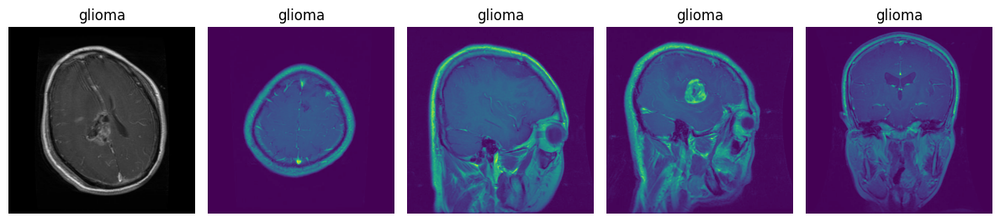

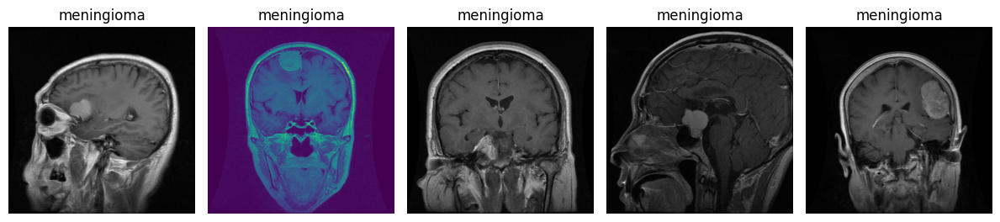

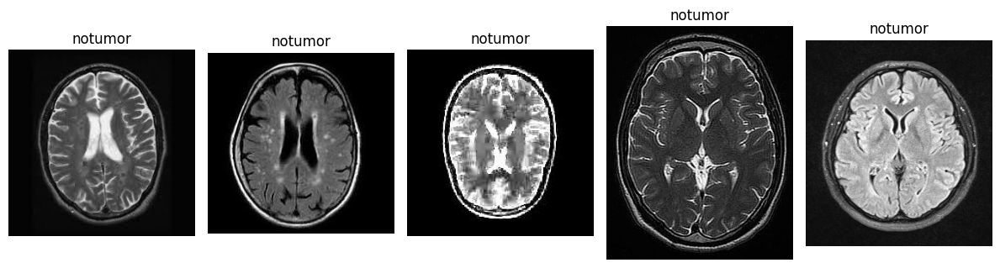

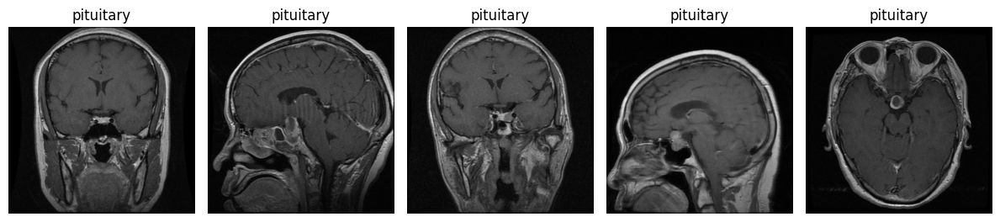

In [2]:
# Get 5 random samples from each class
def plot_samples_from_each_class(generator, class_labels, num_samples=5):
    # Loop through each class
    for class_name in class_labels:
        class_dir = os.path.join(train_dir, class_name)
        class_images = os.listdir(class_dir)
        
        # Shuffle the class images to get random samples
        np.random.shuffle(class_images)
        
        # Select 5 random samples
        class_images = class_images[:num_samples]
        
        plt.figure(figsize=(12, 12))
        
        for i, img_name in enumerate(class_images):
            img_path = os.path.join(class_dir, img_name)
            img = plt.imread(img_path)
            plt.subplot(1, num_samples, i+1)
            plt.imshow(img)
            plt.title(class_name)
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()

# Call the function to plot 5 samples from each class
plot_samples_from_each_class(train_generator, class_labels, num_samples=5)


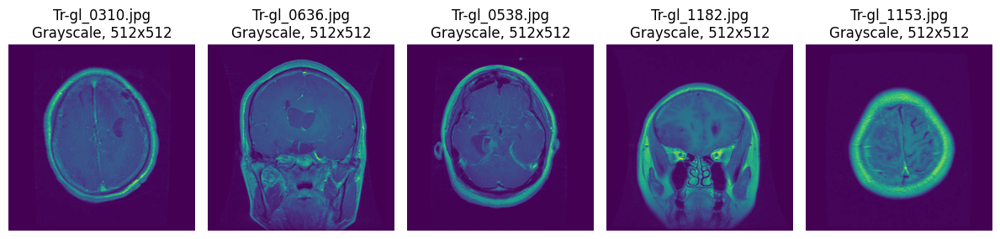

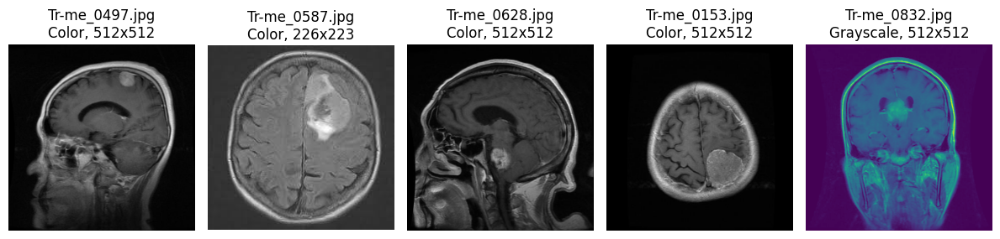

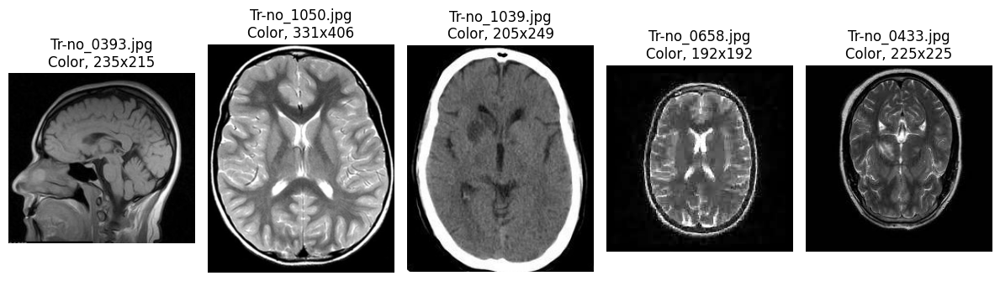

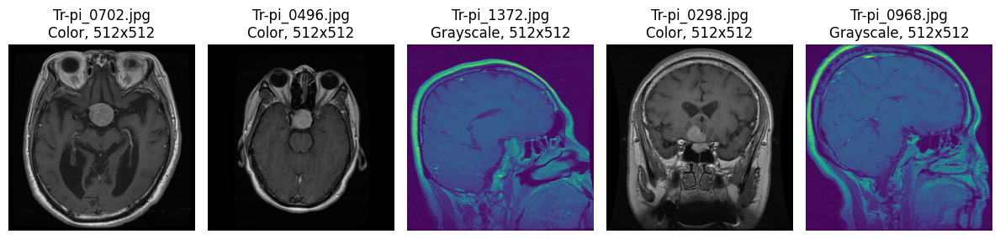

In [3]:
from PIL import Image

# Get 5 random samples from each class with additional info (name, color/grey, resolution)
def plot_samples_from_each_class_with_info(generator, class_labels, num_samples=5):
    # Loop through each class
    for class_name in class_labels:
        class_dir = os.path.join(train_dir, class_name)
        class_images = os.listdir(class_dir)
        
        # Shuffle the class images to get random samples
        np.random.shuffle(class_images)
        
        # Select 5 random samples
        class_images = class_images[:num_samples]
        
        plt.figure(figsize=(12, 12))
        
        for i, img_name in enumerate(class_images):
            img_path = os.path.join(class_dir, img_name)
            img = Image.open(img_path)
            img_arr = np.array(img)
            
            # Determine if the image is grayscale or color (RGB)
            if len(img_arr.shape) == 2:
                img_type = "Grayscale"
            else:
                img_type = "Color"
            
            # Get the resolution of the image (height, width)
            resolution = f"{img.size[0]}x{img.size[1]}"
            
            # Plot the image with additional information
            plt.subplot(1, num_samples, i+1)
            plt.imshow(img)
            plt.title(f"{img_name}\n{img_type}, {resolution}")
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()

# Call the function to plot 5 samples from each class with additional info
plot_samples_from_each_class_with_info(train_generator, class_labels, num_samples=5)


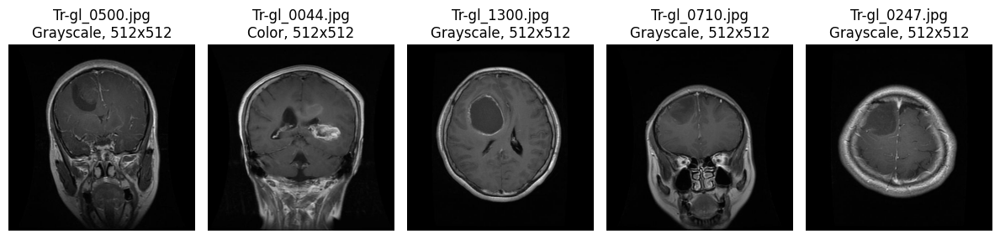

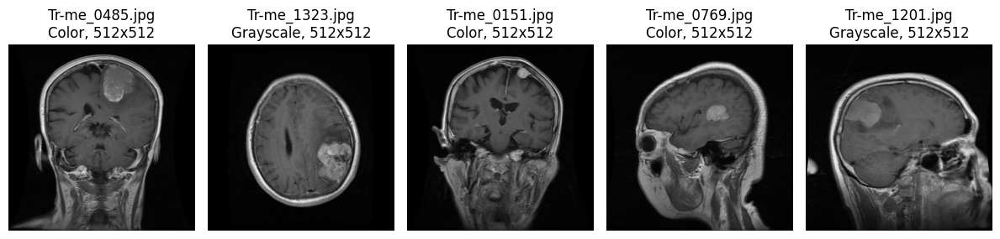

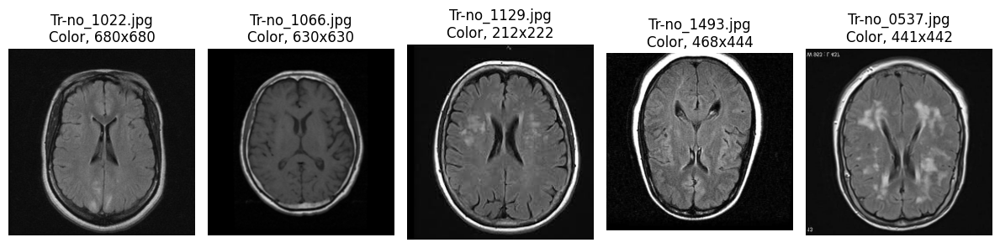

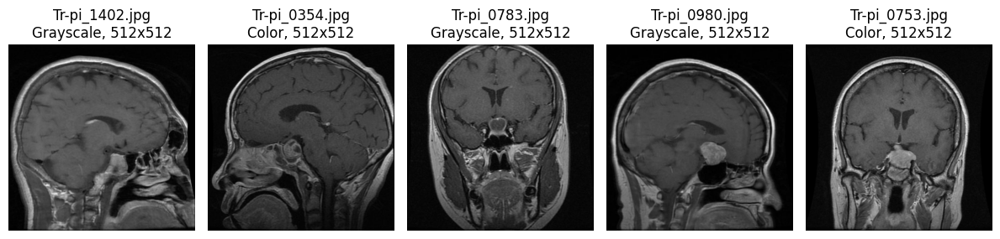

In [4]:
from PIL import Image

# Get 5 random samples from each class with additional info (name, color/grey, resolution)
def plot_samples_from_each_class_with_info(generator, class_labels, num_samples=5):
    # Loop through each class
    for class_name in class_labels:
        class_dir = os.path.join(train_dir, class_name)
        class_images = os.listdir(class_dir)
        
        # Shuffle the class images to get random samples
        np.random.shuffle(class_images)
        
        # Select 5 random samples
        class_images = class_images[:num_samples]
        
        plt.figure(figsize=(12, 12))
        
        for i, img_name in enumerate(class_images):
            img_path = os.path.join(class_dir, img_name)
            img = Image.open(img_path)
            img_arr = np.array(img)
            
            # Determine if the image is grayscale or color (RGB)
            if len(img_arr.shape) == 2:  # Grayscale
                img_type = "Grayscale"
                plt.subplot(1, num_samples, i+1)
                plt.imshow(img, cmap='gray')  # Use gray colormap for grayscale images
            else:  # Color (RGB)
                img_type = "Color"
                plt.subplot(1, num_samples, i+1)
                plt.imshow(img)  # RGB images are displayed normally
            
            # Get the resolution of the image (height, width)
            resolution = f"{img.size[0]}x{img.size[1]}"
            
            # Plot the image with additional information
            plt.title(f"{img_name}\n{img_type}, {resolution}")
            plt.axis('off')
        
        plt.tight_layout()
        plt.show()

# Call the function to plot 5 samples from each class with additional info
plot_samples_from_each_class_with_info(train_generator, class_labels, num_samples=5)


# 2. Model Definition and Training

In [5]:
import tensorflow as tf
from tensorflow.keras import layers, models, optimizers, callbacks,  Input

def create_named_model(input_shape=(224, 224, 3), num_classes=4):
    inputs = Input(shape=input_shape, name='input_layer')

    x = layers.Conv2D(32, (4, 4), activation='relu', name='conv1')(inputs)
    x = layers.MaxPooling2D((2, 2), name='pool1')(x)

    x = layers.Conv2D(64, (4, 4), activation='relu', name='conv2')(x)
    x = layers.MaxPooling2D((2, 2), name='pool2')(x)

    x = layers.Conv2D(128, (4, 4), activation='relu', name='conv3')(x)
    x = layers.MaxPooling2D((2, 2), name='pool3')(x)

    
    x = layers.Flatten(name='flatten')(x)
    x = layers.Dense(256, activation='relu', name='dense1')(x)
    x = layers.Dropout(0.4, name='dropout')(x)
    outputs = layers.Dense(num_classes, activation='softmax', name='output')(x)

    model = models.Model(inputs=inputs, outputs=outputs, name='cnn_model')
    return model

# Create model
model = create_named_model(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3), num_classes=len(class_labels))

# ✅ Compile model with adaptive learning rate
initial_lr = 0.001
lr_schedule = optimizers.schedules.ExponentialDecay(
    initial_learning_rate=initial_lr,
    decay_steps=10000,
    decay_rate=0.95,
    staircase=True
)

model.compile(
    optimizer=optimizers.Adam(learning_rate=lr_schedule),
    loss='categorical_crossentropy',
    metrics=['accuracy', tf.keras.metrics.AUC(name='auc')]
)

# ✅ Callbacks
early_stop = callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
checkpoint = callbacks.ModelCheckpoint('best_model.keras', save_best_only=True)

# ✅ Train model
history = model.fit(train_generator, epochs=EP,validation_data=validation_generator, callbacks=[early_stop, checkpoint], verbose=0)
model.summary()

I0000 00:00:1745214129.229860      19 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0
/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1745214134.694934      82 service.cc:148] XLA service 0x7a4d2c00ca40 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745214134.695788      82 service.cc:156]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1745214135.025768      82 cuda_dnn.cc:529] Loaded cuDNN version 90300
I0000 00:00:1745

Model: "cnn_model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv1 (Conv2D)                       │ (None, 221, 221, 32)        │           1,568 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool1 (MaxPooling2D)                 │ (None, 110, 110, 32)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2 (Conv2D)                       │ (None, 107, 107, 64)        │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool2 (MaxPooling2D)                 │ (None, 53, 53, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv3 (Conv2D)                       │ (None, 50, 50, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ pool3 (MaxPooling2D)                 │ (None, 25, 25, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 80000)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense1 (Dense)                       │ (None, 256)                 │      20,480,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 256)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ output (Dense)                       │ (None, 4)                   │           1,028 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 61,940,653 (236.28 MB)

 Trainable params: 20,646,884 (78.76 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 41,293,769 (157.52 MB)

# 3. Single Image Prediction

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


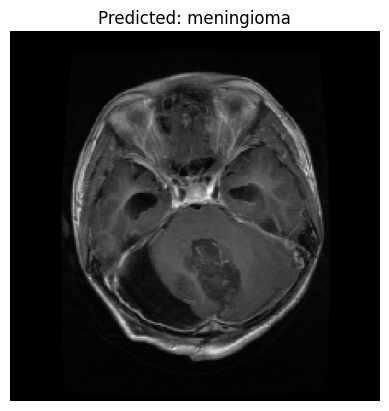

In [6]:
# 3. Single Image Prediction
 
from tensorflow.keras.preprocessing import image

# Load and preprocess a single image
def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = image.img_to_array(img) / 255.0
    return np.expand_dims(img_array, axis=0), img

# Example usage
sample_img_path = test_generator.filepaths[0]
img_array, img = load_and_preprocess_image(sample_img_path)

# Predict
prediction = model.predict(img_array)
predicted_class = class_labels[np.argmax(prediction)]

# Display
plt.imshow(img)
plt.title(f'Predicted: {predicted_class}')
plt.axis('off')
plt.show()


#### 4. Feature Map Visualization

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 320ms/step


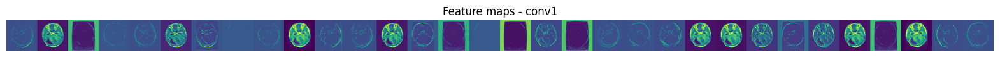

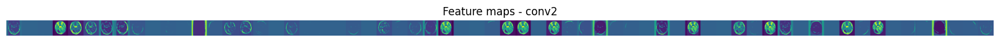

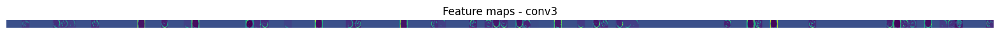

In [7]:
# 4. Feature Map Visualization
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image

# Visualize feature maps of intermediate convolution layers
def visualize_feature_maps(img_path):
    img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Select convolutional layers
    conv_layer_outputs = [layer.output for layer in model.layers if 'conv' in layer.name]

    # Build a new model for intermediate outputs
    activation_model = models.Model(inputs=model.input, outputs=conv_layer_outputs)

    # Predict activations
    activations = activation_model.predict(img_array)

    for layer_name, layer_activation in zip([layer.name for layer in model.layers if 'conv' in layer.name], activations):
        num_filters = layer_activation.shape[-1]
        size = layer_activation.shape[1]

        display_grid = np.zeros((size, size * num_filters))

        for i in range(num_filters):
            activation_map = layer_activation[0, :, :, i]
            activation_map -= activation_map.mean()
            activation_map /= activation_map.std() + 1e-5
            activation_map *= 64
            activation_map += 128
            activation_map = np.clip(activation_map, 0, 255).astype('uint8')
            display_grid[:, i * size : (i + 1) * size] = activation_map

        scale = 20. / num_filters
        plt.figure(figsize=(scale * num_filters, scale))
        plt.title(f'Feature maps - {layer_name}')
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.axis('off')
        plt.show()

# Example usage
visualize_feature_maps(test_generator.filepaths[0])


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 253ms/step


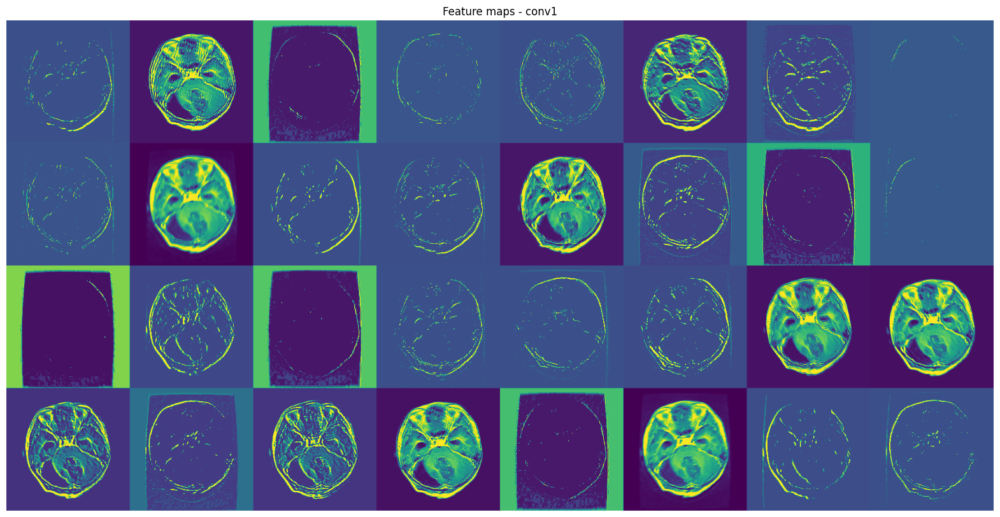

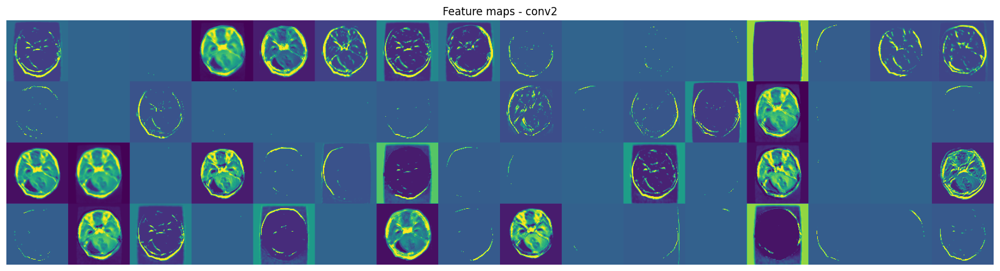

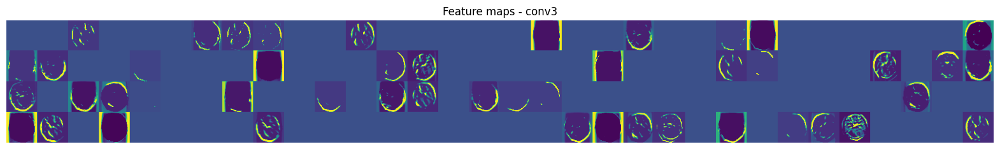

In [8]:
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image

# Visualize feature maps of intermediate convolution layers
def visualize_feature_maps(img_path, num_rows=4):
    img = image.load_img(img_path, target_size=(IMG_HEIGHT, IMG_WIDTH))
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Select convolutional layers
    conv_layer_outputs = [layer.output for layer in model.layers if 'conv' in layer.name]

    # Build a new model for intermediate outputs
    activation_model = tf.keras.models.Model(inputs=model.input, outputs=conv_layer_outputs)

    # Predict activations
    activations = activation_model.predict(img_array)

    for layer_name, layer_activation in zip([layer.name for layer in model.layers if 'conv' in layer.name], activations):
        num_filters = layer_activation.shape[-1]
        size = layer_activation.shape[1]

        # Calculate the number of rows needed
        num_cols = num_filters // num_rows

        display_grid = np.zeros((size * num_rows, size * num_cols))

        for i in range(num_filters):
            row = i // num_cols
            col = i % num_cols
            activation_map = layer_activation[0, :, :, i]
            activation_map -= activation_map.mean()
            activation_map /= activation_map.std() + 1e-5
            activation_map *= 64
            activation_map += 128
            activation_map = np.clip(activation_map, 0, 255).astype('uint8')

            # Place the activation map in the correct row and column
            display_grid[row * size: (row + 1) * size, col * size: (col + 1) * size] = activation_map

        scale = 20. / num_cols
        plt.figure(figsize=(scale * num_cols, scale * num_rows))
        plt.title(f'Feature maps - {layer_name}')
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.axis('off')
        plt.show()

# Example usage
visualize_feature_maps(test_generator.filepaths[0], num_rows=4)


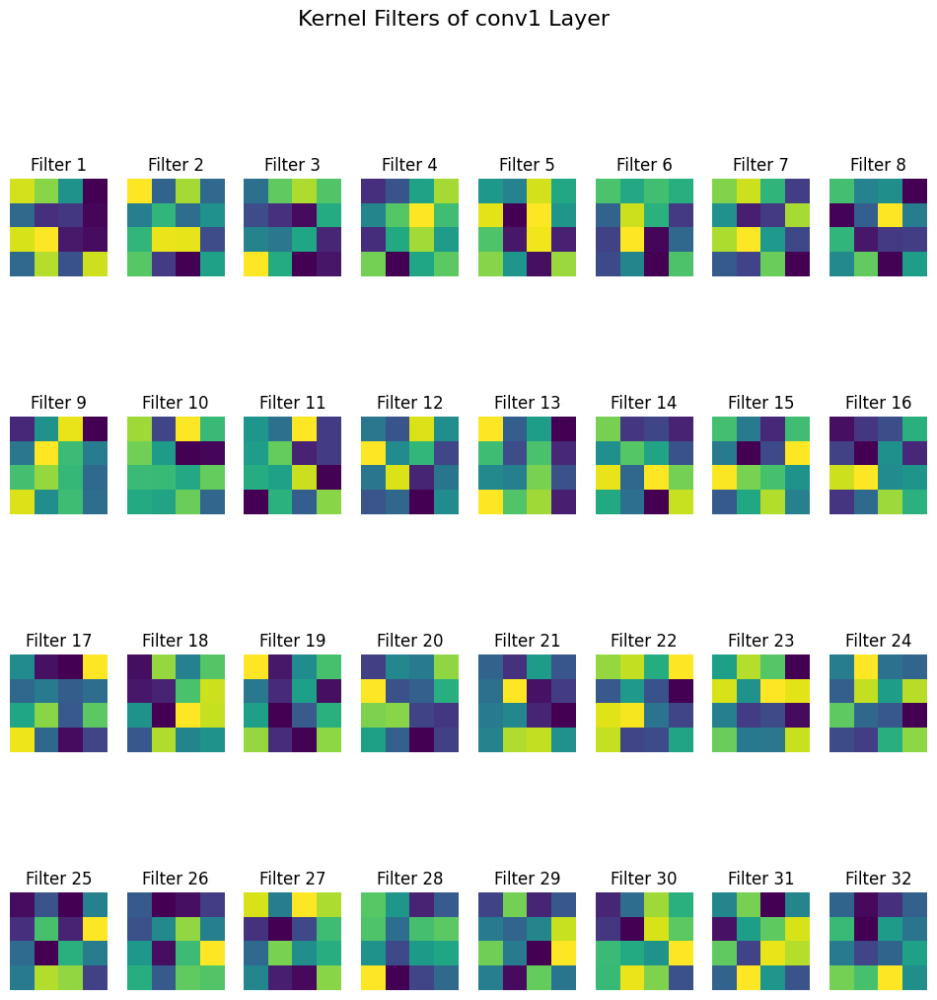

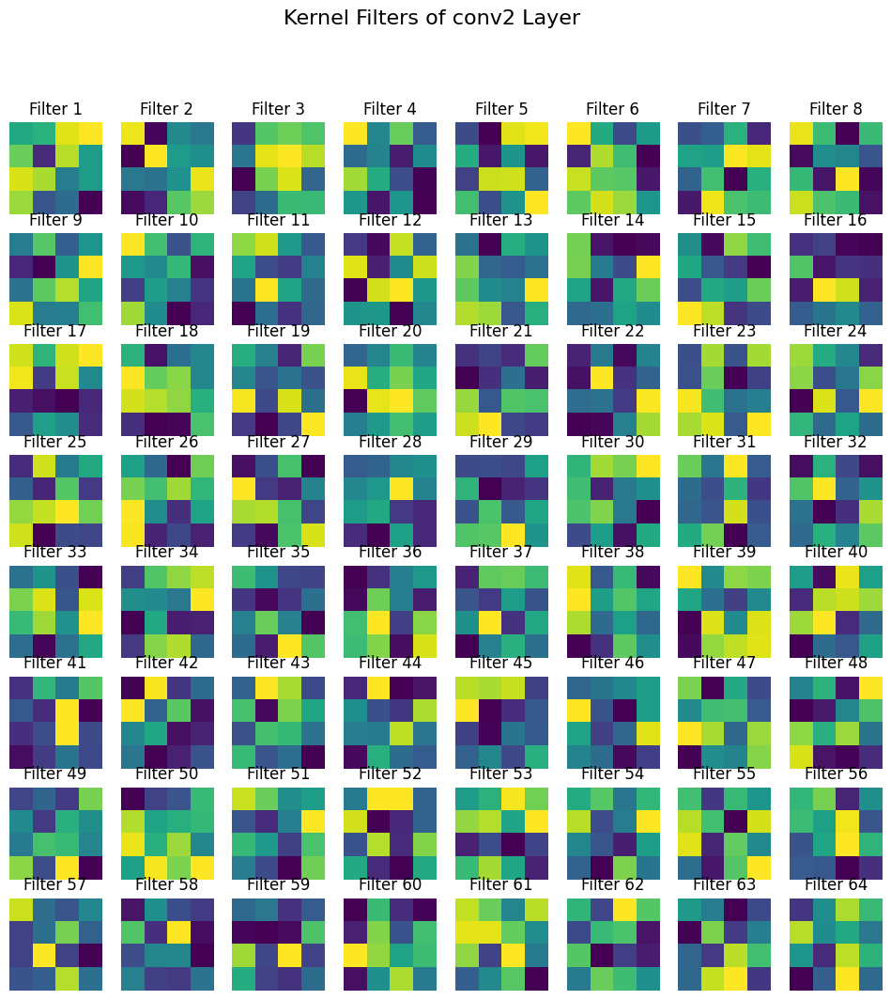

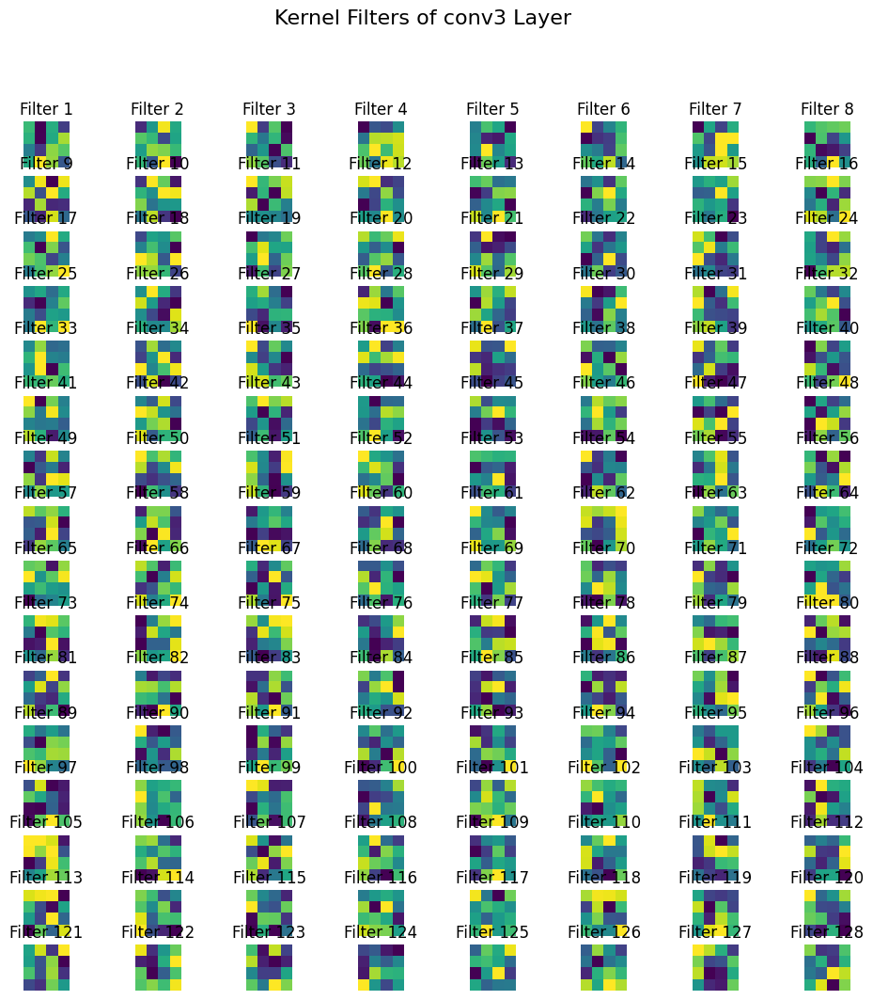

In [9]:
import matplotlib.pyplot as plt
import numpy as np

# Visualize kernels (filters) of all convolutional layers
def visualize_kernels(model):
    # Iterate through all convolutional layers
    for layer in model.layers:
        if isinstance(layer, layers.Conv2D):
            filters, biases = layer.get_weights()
            num_filters = filters.shape[-1]
            filter_size = filters.shape[0]
            
            # Plot filters row by row
            num_columns = 8  # Number of columns for displaying filters
            num_rows = num_filters // num_columns
            
            plt.figure(figsize=(12, 12))
            for i in range(num_filters):
                plt.subplot(num_rows, num_columns, i + 1)
                filter_img = filters[:, :, :, i]
                filter_img -= filter_img.mean()  # Normalize filter
                filter_img /= filter_img.std() + 1e-5  # Standardize filter
                filter_img *= 64
                filter_img += 128
                filter_img = np.clip(filter_img, 0, 255).astype('uint8')
                plt.imshow(filter_img[:, :, 0], cmap='viridis')  # Show the first channel (grayscale)
                plt.axis('off')
                plt.title(f'Filter {i + 1}')
            plt.suptitle(f'Kernel Filters of {layer.name} Layer', fontsize=16)
            plt.show()

# Visualize kernels for all convolutional layers
visualize_kernels(model)



Layer: conv1, Total Filters: 32, Input Channels: 3


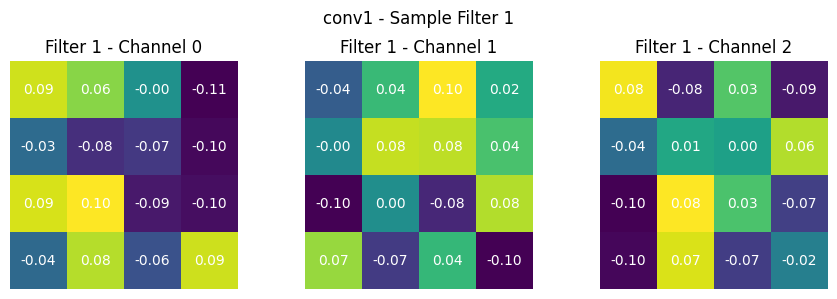

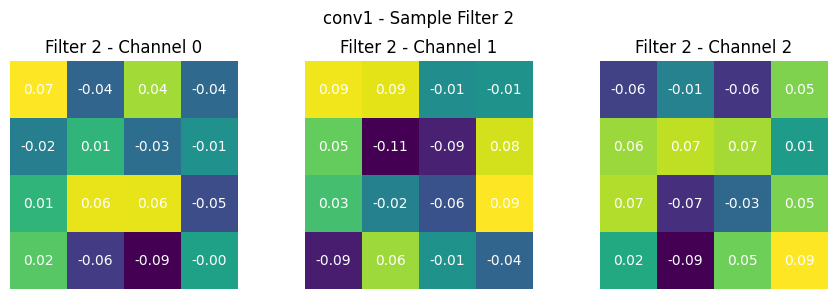

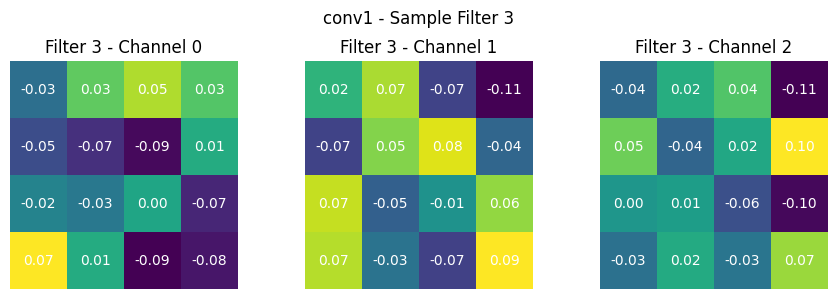

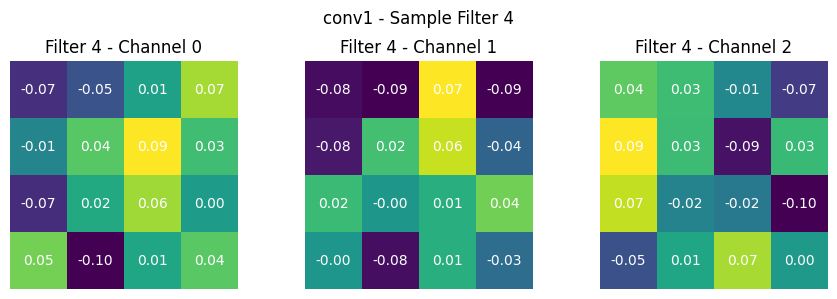

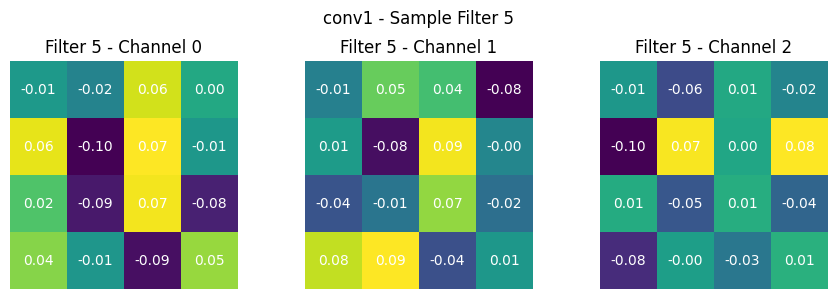


Layer: conv2, Total Filters: 64, Input Channels: 32


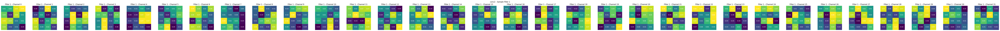

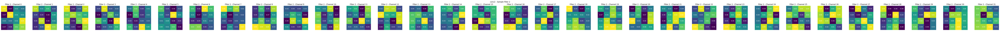

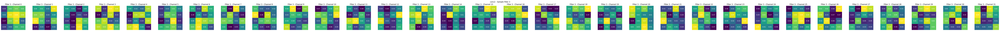

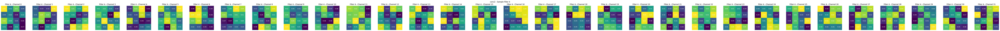

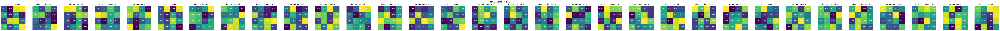


Layer: conv3, Total Filters: 128, Input Channels: 64


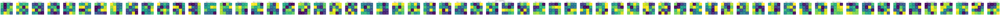

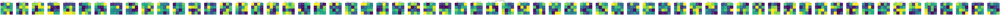

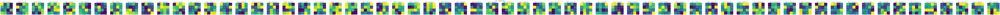

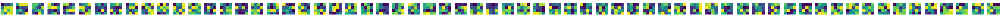

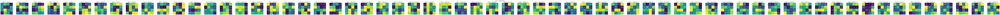

In [10]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import layers  # Ensure this is imported

# Visualize a few sample kernels from each Conv2D layer
def visualize_sample_kernels(model, num_samples=5):
    for layer in model.layers:
        if isinstance(layer, layers.Conv2D):
            filters, biases = layer.get_weights()
            num_filters = filters.shape[-1]
            input_channels = filters.shape[2]
            kernel_height, kernel_width = filters.shape[0], filters.shape[1]

            print(f"\nLayer: {layer.name}, Total Filters: {num_filters}, Input Channels: {input_channels}")

            # Limit to the first 'num_samples' filters
            sample_filters = min(num_filters, num_samples)

            for i in range(sample_filters):
                plt.figure(figsize=(input_channels * 3, 3))
                for ch in range(input_channels):
                    kernel = filters[:, :, ch, i]

                    # Normalize for visualization
                    norm_kernel = (kernel - np.min(kernel)) / (np.max(kernel) - np.min(kernel) + 1e-6)

                    ax = plt.subplot(1, input_channels, ch + 1)
                    im = ax.imshow(norm_kernel, cmap='viridis')

                    # Annotate each cell with the value
                    for y in range(kernel_height):
                        for x in range(kernel_width):
                            value = kernel[y, x]
                            ax.text(x, y, f"{value:.2f}", ha='center', va='center', color='white', fontsize=10)

                    ax.set_title(f"Filter {i+1} - Channel {ch}")
                    ax.axis('off')

                plt.suptitle(f"{layer.name} - Sample Filter {i+1}")
                plt.tight_layout()
                plt.show()

# Call the function
visualize_sample_kernels(model, num_samples=5)



Layer: conv1, Total Filters: 32, Input Channels: 3


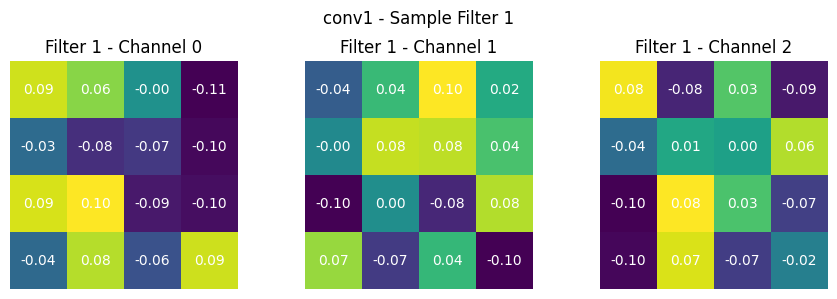

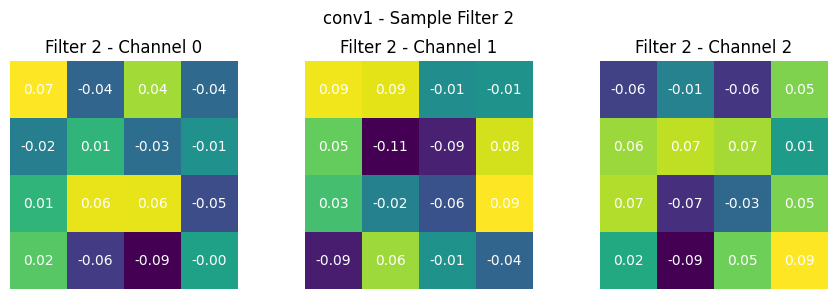

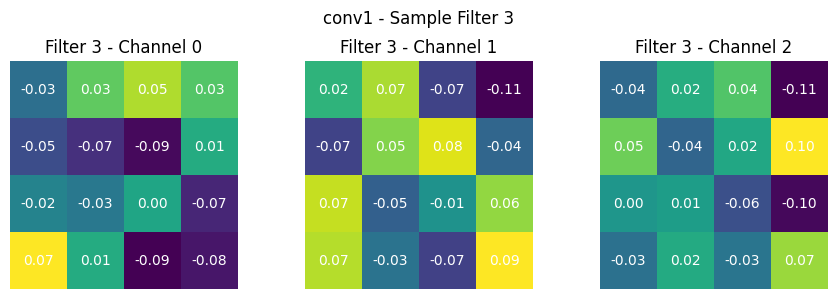


Layer: conv2, Total Filters: 64, Input Channels: 32


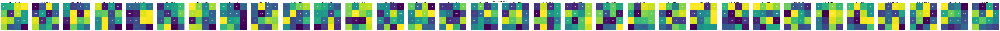

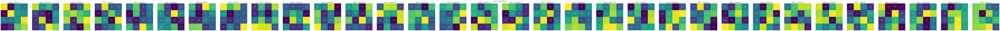

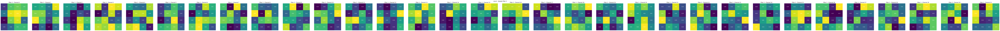


Layer: conv3, Total Filters: 128, Input Channels: 64


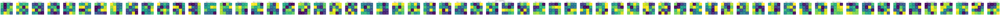

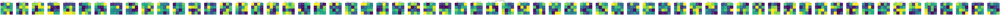

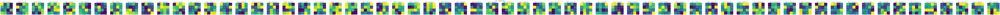

In [11]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import layers  # Ensure this is imported

# Visualize a few sample kernels from each Conv2D layer
def visualize_sample_kernels(model, num_samples=3):
    conv_layer_count = 0  # Track which conv layer we're on

    for layer in model.layers:
        if isinstance(layer, layers.Conv2D):
            conv_layer_count += 1

            filters, biases = layer.get_weights()
            num_filters = filters.shape[-1]
            input_channels = filters.shape[2]
            kernel_height, kernel_width = filters.shape[0], filters.shape[1]

            print(f"\nLayer: {layer.name}, Total Filters: {num_filters}, Input Channels: {input_channels}")

            sample_filters = min(num_filters, num_samples)

            for i in range(sample_filters):
                # Adjust figure size: bigger if it's the 2nd Conv2D layer
                fig_width = input_channels * 3
                fig_height = 3
                if conv_layer_count == 2:
                    fig_width *= 1.5
                    fig_height *= 1.5

                plt.figure(figsize=(fig_width, fig_height))

                for ch in range(input_channels):
                    kernel = filters[:, :, ch, i]

                    # Normalize for visualization
                    norm_kernel = (kernel - np.min(kernel)) / (np.max(kernel) - np.min(kernel) + 1e-6)

                    ax = plt.subplot(1, input_channels, ch + 1)
                    im = ax.imshow(norm_kernel, cmap='viridis')

                    # Annotate each cell with the value
                    for y in range(kernel_height):
                        for x in range(kernel_width):
                            value = kernel[y, x]
                            ax.text(x, y, f"{value:.2f}", ha='center', va='center', color='white', fontsize=10)

                    ax.set_title(f"Filter {i+1} - Channel {ch}")
                    ax.axis('off')

                plt.suptitle(f"{layer.name} - Sample Filter {i+1}")
                plt.tight_layout()
                plt.show()

# Call the function
visualize_sample_kernels(model, num_samples=3)



Layer: conv1, Total Filters: 32, Input Channels: 3


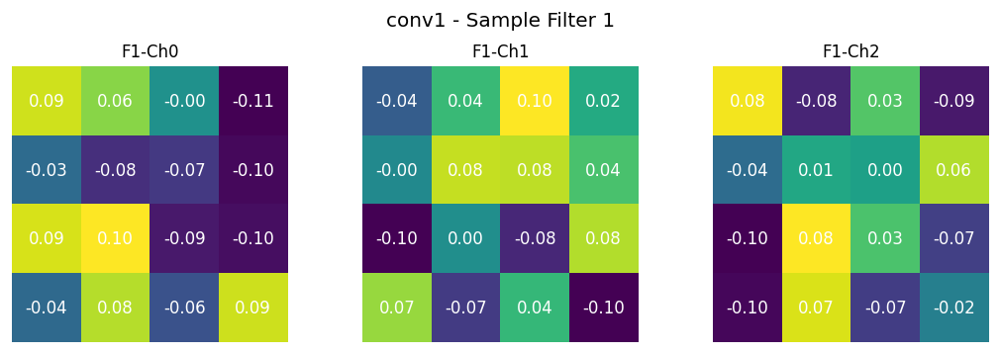

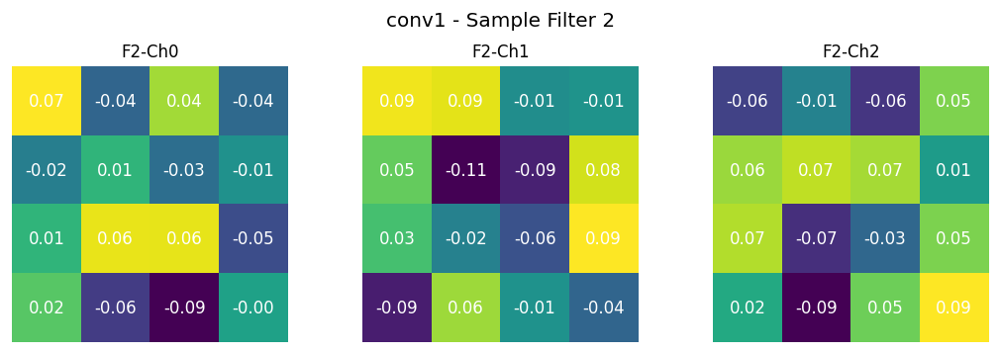

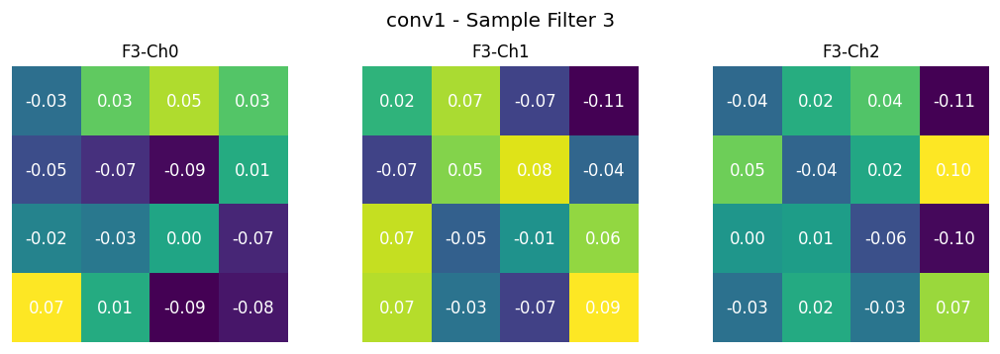


Layer: conv2, Total Filters: 64, Input Channels: 32


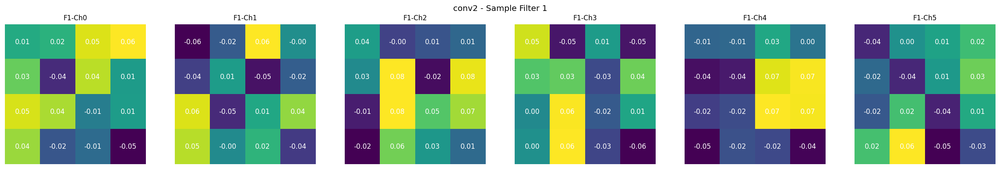

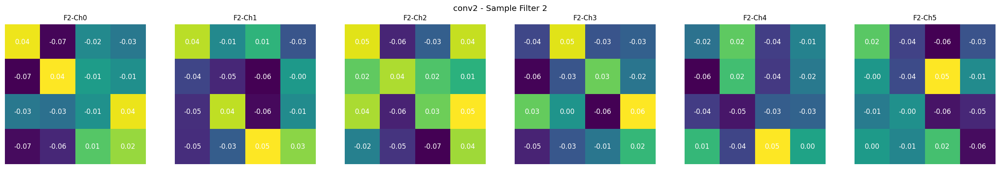

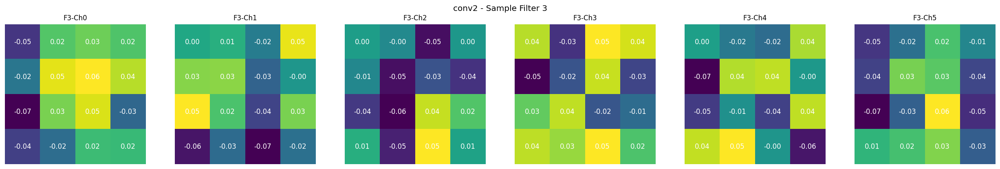


Layer: conv3, Total Filters: 128, Input Channels: 64


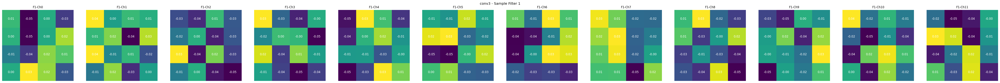

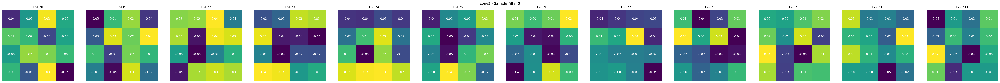

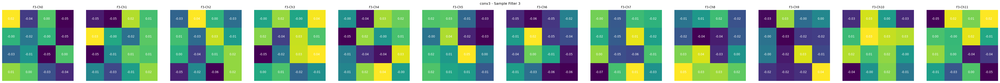

In [12]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import layers

# Visualize a few sample kernels from each Conv2D layer
def visualize_sample_kernels(model, num_samples=3):
    conv_layer_count = 0  # Track which Conv2D layer we're on

    for layer in model.layers:
        if isinstance(layer, layers.Conv2D):
            conv_layer_count += 1

            filters, biases = layer.get_weights()
            num_filters = filters.shape[-1]
            input_channels = filters.shape[2]
            kernel_height, kernel_width = filters.shape[0], filters.shape[1]

            print(f"\nLayer: {layer.name}, Total Filters: {num_filters}, Input Channels: {input_channels}")

            sample_filters = min(num_filters, num_samples)

            for i in range(sample_filters):
                # Determine how many channels to display for each layer
                if layer.name == 'conv2':  # Limit to first 6 channels for conv2
                    display_channels = min(6, input_channels)
                elif layer.name == 'conv3':  # Limit to first 12 channels for conv3
                    display_channels = min(12, input_channels)
                else:
                    display_channels = input_channels

                # Set figure size based on number of channels and layer depth
                if conv_layer_count == 1:
                    fig_width = display_channels * 3
                    fig_height = 3
                elif conv_layer_count == 2:
                    fig_width = display_channels * 3.5
                    fig_height = 3.5
                elif conv_layer_count == 3:
                    fig_width = display_channels * 4
                    fig_height = 4
                else:
                    fig_width = display_channels * 3
                    fig_height = 3

                plt.figure(figsize=(fig_width, fig_height), dpi=120)

                for ch in range(display_channels):
                    kernel = filters[:, :, ch, i]
                    norm_kernel = (kernel - np.min(kernel)) / (np.max(kernel) - np.min(kernel) + 1e-6)

                    ax = plt.subplot(1, display_channels, ch + 1)
                    im = ax.imshow(norm_kernel, cmap='viridis')

                    # Annotate each cell with the value
                    for y in range(kernel_height):
                        for x in range(kernel_width):
                            value = kernel[y, x]
                            ax.text(x, y, f"{value:.2f}", ha='center', va='center', color='white', fontsize=10)

                    ax.set_title(f"F{i+1}-Ch{ch}", fontsize=10)
                    ax.axis('off')

                plt.suptitle(f"{layer.name} - Sample Filter {i+1}")
                plt.tight_layout()
                plt.show()

# Call the function
visualize_sample_kernels(model, num_samples=3)



Layer: conv1, Total Filters: 32, Input Channels: 3


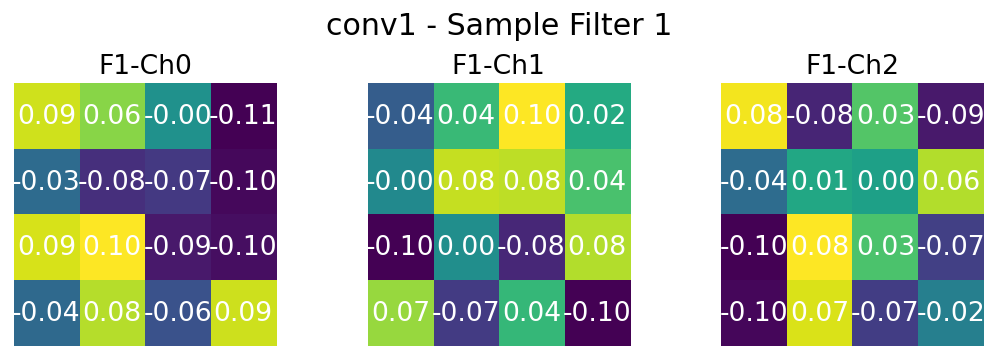

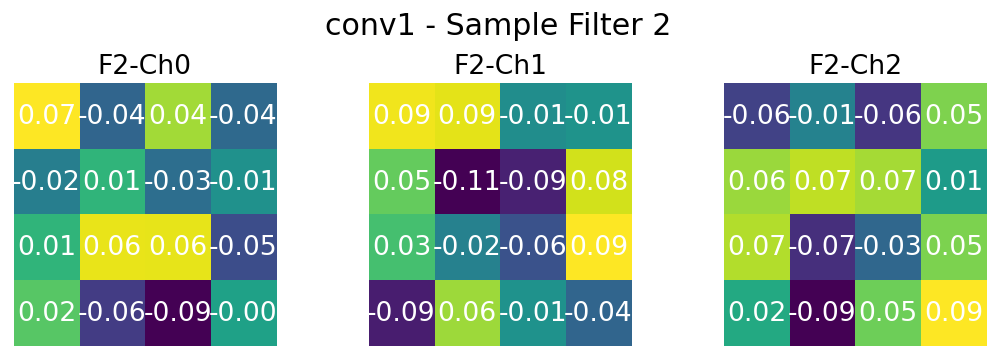


Layer: conv2, Total Filters: 64, Input Channels: 32


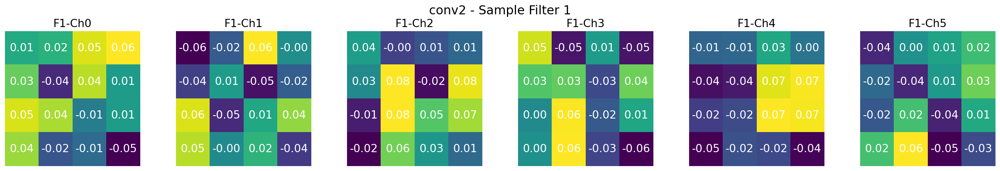

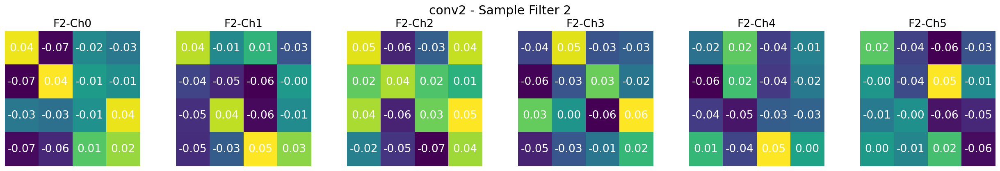


Layer: conv3, Total Filters: 128, Input Channels: 64


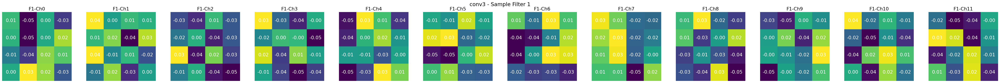

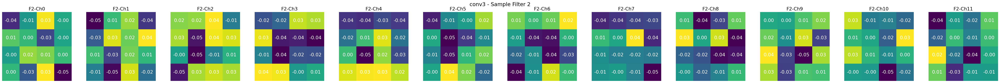

In [13]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import layers

# Visualize a few sample kernels from each Conv2D layer
def visualize_sample_kernels(model, num_samples=3):
    conv_layer_count = 0  # Track which Conv2D layer we're on

    for layer in model.layers:
        if isinstance(layer, layers.Conv2D):
            conv_layer_count += 1

            filters, biases = layer.get_weights()
            num_filters = filters.shape[-1]
            input_channels = filters.shape[2]
            kernel_height, kernel_width = filters.shape[0], filters.shape[1]

            print(f"\nLayer: {layer.name}, Total Filters: {num_filters}, Input Channels: {input_channels}")

            sample_filters = min(num_filters, num_samples)

            for i in range(sample_filters):
                # Determine how many channels to display for each layer
                if layer.name == 'conv2':  # Limit to first 6 channels for conv2
                    display_channels = min(6, input_channels)
                elif layer.name == 'conv3':  # Limit to first 12 channels for conv3
                    display_channels = min(12, input_channels)
                else:
                    display_channels = input_channels

                # Set figure size based on number of channels and layer depth
                if conv_layer_count == 1:
                    fig_width = display_channels * 3
                    fig_height = 3
                elif conv_layer_count == 2:
                    fig_width = display_channels * 3.5
                    fig_height = 3.5
                elif conv_layer_count == 3:
                    fig_width = display_channels * 4
                    fig_height = 4
                else:
                    fig_width = display_channels * 3
                    fig_height = 3

                plt.figure(figsize=(fig_width, fig_height), dpi=120)

                for ch in range(display_channels):
                    kernel = filters[:, :, ch, i]
                    norm_kernel = (kernel - np.min(kernel)) / (np.max(kernel) - np.min(kernel) + 1e-6)

                    ax = plt.subplot(1, display_channels, ch + 1)
                    im = ax.imshow(norm_kernel, cmap='viridis')

                    # Annotate each cell with the value (increased font size)
                    for y in range(kernel_height):
                        for x in range(kernel_width):
                            value = kernel[y, x]
                            ax.text(x, y, f"{value:.2f}", ha='center', va='center', color='white', fontsize=16)   

                    ax.set_title(f"F{i+1}-Ch{ch}", fontsize=16)   
                    ax.axis('off')

                plt.suptitle(f"{layer.name} - Sample Filter {i+1}", fontsize=18)    
                plt.tight_layout()
                plt.show()

# Call the function
visualize_sample_kernels(model, num_samples=2)



Layer: conv1, Total Filters: 32, Input Channels: 3


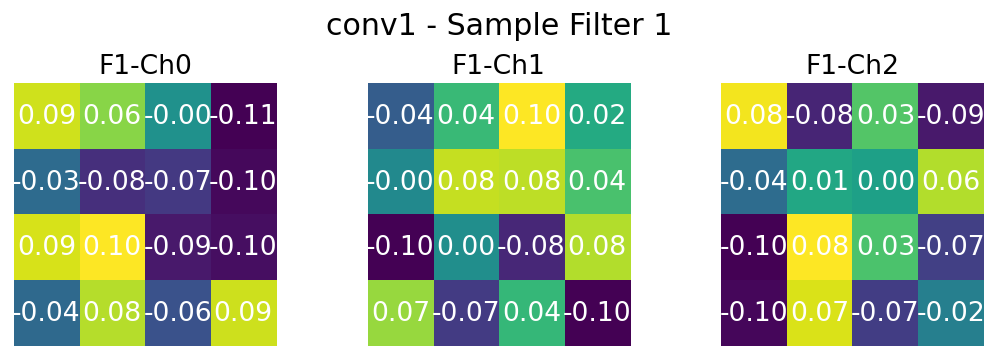

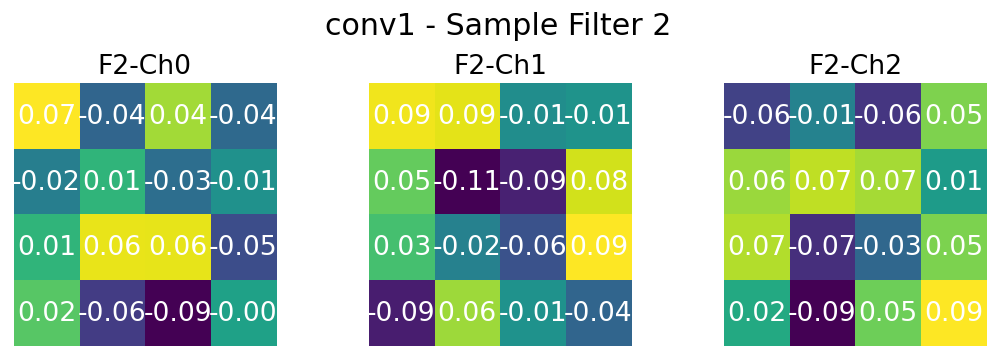

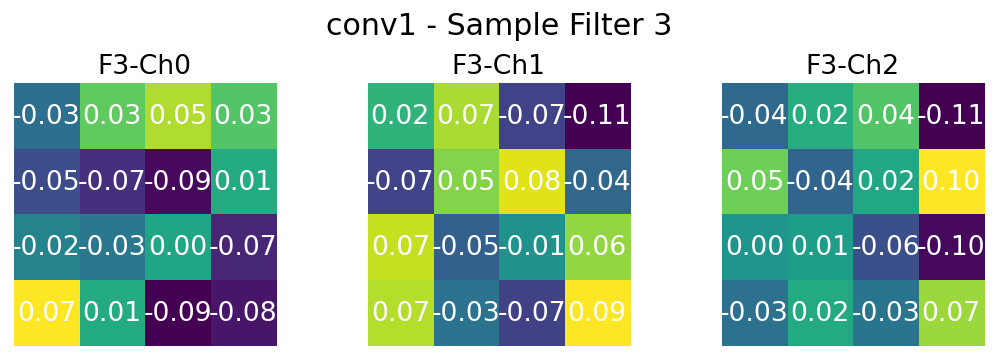

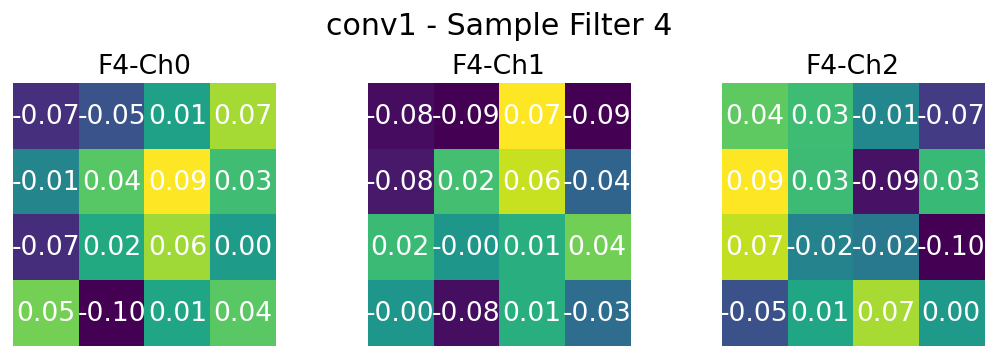


Layer: conv2, Total Filters: 64, Input Channels: 32


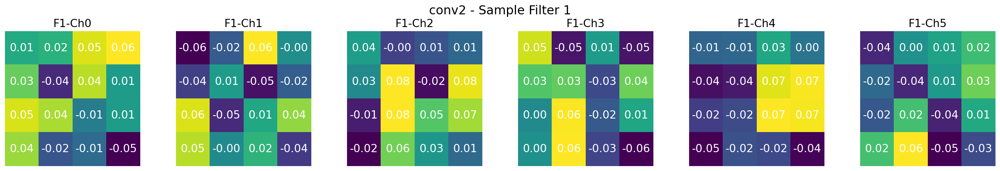

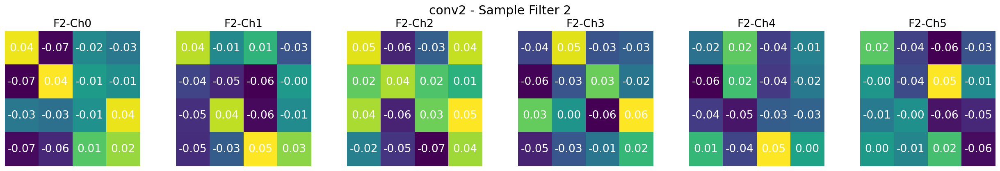

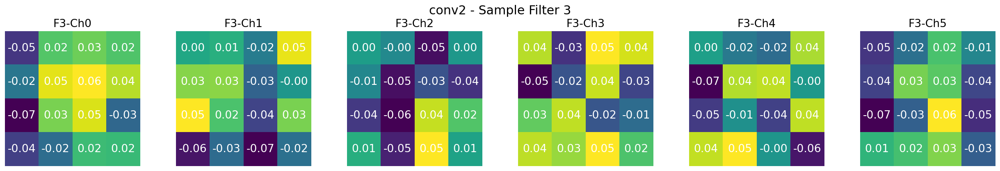

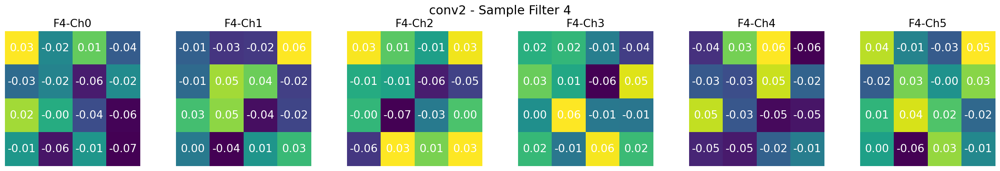


Layer: conv3, Total Filters: 128, Input Channels: 64


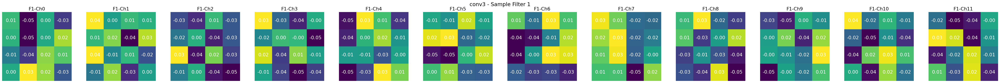

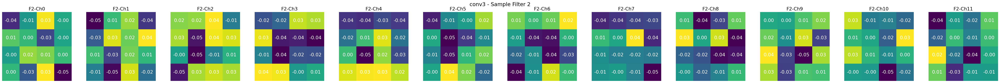

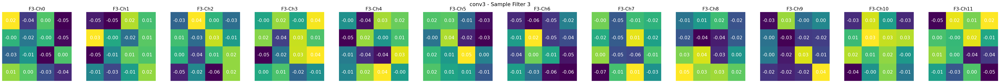

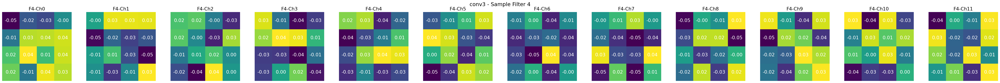

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from tensorflow.keras import layers

# Visualize a few sample kernels from each Conv2D layer
def visualize_sample_kernels(model, num_samples=3):
    conv_layer_count = 0  # Track which Conv2D layer we're on

    for layer in model.layers:
        if isinstance(layer, layers.Conv2D):
            conv_layer_count += 1

            filters, biases = layer.get_weights()
            num_filters = filters.shape[-1]
            input_channels = filters.shape[2]
            kernel_height, kernel_width = filters.shape[0], filters.shape[1]

            print(f"\nLayer: {layer.name}, Total Filters: {num_filters}, Input Channels: {input_channels}")

            sample_filters = min(num_filters, num_samples)

            for i in range(sample_filters):
                # Determine how many channels to display for each layer
                if layer.name == 'conv2':  # Limit to first 6 channels for conv2
                    display_channels = min(6, input_channels)
                elif layer.name == 'conv3':  # Limit to first 12 channels for conv3
                    display_channels = min(12, input_channels)
                else:
                    display_channels = input_channels

                # Set figure size based on number of channels and layer depth
                if conv_layer_count == 1:
                    fig_width = display_channels * 3
                    fig_height = 3
                elif conv_layer_count == 2:
                    fig_width = display_channels * 3.5
                    fig_height = 3.5
                elif conv_layer_count == 3:
                    fig_width = display_channels * 4
                    fig_height = 4
                else:
                    fig_width = display_channels * 3
                    fig_height = 3

                plt.figure(figsize=(fig_width, fig_height), dpi=120)

                for ch in range(display_channels):
                    kernel = filters[:, :, ch, i]
                    norm_kernel = (kernel - np.min(kernel)) / (np.max(kernel) - np.min(kernel) + 1e-6)

                    ax = plt.subplot(1, display_channels, ch + 1)
                    im = ax.imshow(norm_kernel, cmap='viridis')

                    # Annotate each cell with the value (increased font size)
                    for y in range(kernel_height):
                        for x in range(kernel_width):
                            value = kernel[y, x]
                            ax.text(x, y, f"{value:.2f}", ha='center', va='center', color='white', fontsize=16)   

                    ax.set_title(f"F{i+1}-Ch{ch}", fontsize=16)   
                    ax.axis('off')

                plt.suptitle(f"{layer.name} - Sample Filter {i+1}", fontsize=18)    
                plt.tight_layout()
                plt.show()

# Call the function
visualize_sample_kernels(model, num_samples=4)
